# Dependencies and files

## Install dependencies

## Imports

In [35]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

import time
from tqdm.notebook import tqdm
import requests

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [36]:
de_dir_path = '../../data/DE/ANOVA_mean/'

In [37]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [38]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown']

In [39]:
os.listdir(de_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'ttest_mamm_mean.csv']

## Load files

### DE results

In [40]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_mean.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,0.122578,12.0,2.796490,0.003701,0.010364
AAAS,0.017527,12.0,0.944161,0.509517,0.596369
AACS,0.136394,12.0,2.729393,0.004508,0.012212
AADAT,0.057031,12.0,5.478881,0.000002,0.000016
AAGAB,0.043359,12.0,2.127609,0.026045,0.053640


In [41]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels
anova_labels.name = 'ANOVA_labels'

In [42]:
ancova_labels = pd.read_csv('./results/human_clusters_ancova_01_cos_all_8.csv', index_col=0)['0'].sort_values()
ancova_labels

EIF1B     0
ENC1      0
ETFB      0
DAAM1     0
TMOD1     0
         ..
CNKSR2    7
ALCAM     7
EIF4G3    7
PTPRK     7
KRT222    7
Name: 0, Length: 100, dtype: int64

## Load normalized pseudobulks

In [43]:
pb_dir_path = 'results/'

In [44]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean_filtered.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 5390
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

In [45]:
background_genes = adata_pb_norm.var_names.tolist()
len(background_genes)

5390

## Specie-specific genes

In [46]:
model_res = pd.read_csv('results/gene_selection_df.csv', index_col=0)
model_res.head()

,human,chimp,macaque
AACS,0.001206,0.014287,0.318736
AAGAB,0.731575,0.661344,0.024143
AAK1,0.000658,0.699175,0.069657
AAMP,0.762617,0.530339,0.947528
AAR2,0.312623,0.436571,0.343371


In [47]:
import pickle
with open("results/ancova_perm_res.pkl", "rb") as file:
    ancova_results = pickle.load(file)

In [48]:
# import pickle
# with open("./results/specie_specific_genes_tr50.pkl", "rb") as file:
#     genes_dict77 = pickle.load(file)

In [49]:
pval_tr = 0.01
sign_genes = {key:value[value['p-value'] < pval_tr].index for key, value in ancova_results.items()}
sign_genes

{'human-chimp': Index(['ABI2', 'ABLIM3', 'ACTN2', 'ADAM15', 'ADGRB2', 'ADGRL1', 'AK1', 'AKT3',
        'ALCAM', 'ALKBH5',
        ...
        'WDR7', 'WLS', 'YES1', 'YWHAE', 'ZBTB17', 'ZBTB18', 'ZBTB46', 'ZCCHC17',
        'ZMYND8', 'ZNF706'],
       dtype='object', length=322),
 'human-macaque': Index(['AAGAB', 'AARS1', 'AATK', 'ABAT', 'ABCD4', 'ABHD10', 'ABHD6', 'ABHD8',
        'ABLIM3', 'ABT1',
        ...
        'ZNF140', 'ZNF184', 'ZNF189', 'ZNF304', 'ZNF511', 'ZNF536', 'ZNF592',
        'ZNF703', 'ZNF706', 'ZNFX1'],
       dtype='object', length=1355),
 'chimp-macaque': Index(['AATK', 'ABAT', 'ABCC10', 'ABCD4', 'ABHD10', 'ABLIM3', 'ACAD9',
        'ACADVL', 'ACO1', 'ACOT7',
        ...
        'ZC2HC1A', 'ZDHHC22', 'ZDHHC8', 'ZDHHC9', 'ZNF140', 'ZNF184', 'ZNF189',
        'ZNF536', 'ZNF655', 'ZNF703'],
       dtype='object', length=874)}

Попробуем определить человеко-специфичные гены как $(HC\bigcap HM)\setminus CM$

In [50]:
hs_genes = sign_genes['human-chimp'].intersection(sign_genes['human-macaque']).difference(sign_genes['chimp-macaque'])
hs_genes, hs_genes.size

(Index(['ADAM15', 'AKT3', 'ALCAM', 'AMFR', 'APLP2', 'ASAH1', 'ASAP2', 'ATAD1',
        'BLVRA', 'CADM3', 'CCSER2', 'CD99L2', 'CNKSR2', 'COTL1', 'CPNE2',
        'CPNE6', 'DAAM1', 'DCLK1', 'DKK3', 'DLC1', 'DNM2', 'DNPEP', 'DPYSL5',
        'DYNLL2', 'EEF1G', 'EIF1B', 'EIF3F', 'EIF4G3', 'ELOC', 'ENC1',
        'EPB41L3', 'ETFB', 'FADS2', 'FAM171B', 'FBXO9', 'FGF9', 'FOXP1', 'GDE1',
        'GNAZ', 'GNPTAB', 'GRM3', 'ID2', 'IGFBP2', 'IGFBP6', 'IGSF21', 'JAM2',
        'KHDRBS3', 'KIF21B', 'KLF6', 'KRT222', 'LINGO1', 'LPL', 'MARCKS',
        'MAU2', 'NCAM2', 'NOL10', 'NRXN1', 'NRXN2', 'OCIAD2', 'OTUD4', 'PCDH9',
        'PCGF2', 'PCP4', 'PDE1A', 'PES1', 'PHACTR3', 'PPP2R2C', 'PTPRK',
        'RAB10', 'RAB3GAP1', 'RALYL', 'RBM23', 'RNF40', 'RSPH9', 'SCD5',
        'SCN3B', 'SEZ6L2', 'SIAH1', 'SLC17A7', 'SLC25A29', 'SLC38A10',
        'SLC38A3', 'SLC39A10', 'SLC9A3R2', 'SMARCA1', 'SND1', 'SNRPD2', 'STAU2',
        'SYNGAP1', 'TECR', 'TMED3', 'TMEM108', 'TMOD1', 'USP6NL', 'VAT1L',
        'WD

# Clusterisation

In [51]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)

In [52]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df[hs_genes].copy()

In [53]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown', 'cyan', 'pink', 'violet', 'crimson', 'tab:red', 'tab:green']

In [54]:
n_clusters = ancova_labels.unique().size
order = ancova_labels.sort_values().index

In [55]:
colors = cluster_color[:n_clusters]
clusters = np.arange(n_clusters)

In [56]:
sns.set(font_scale=0.8)

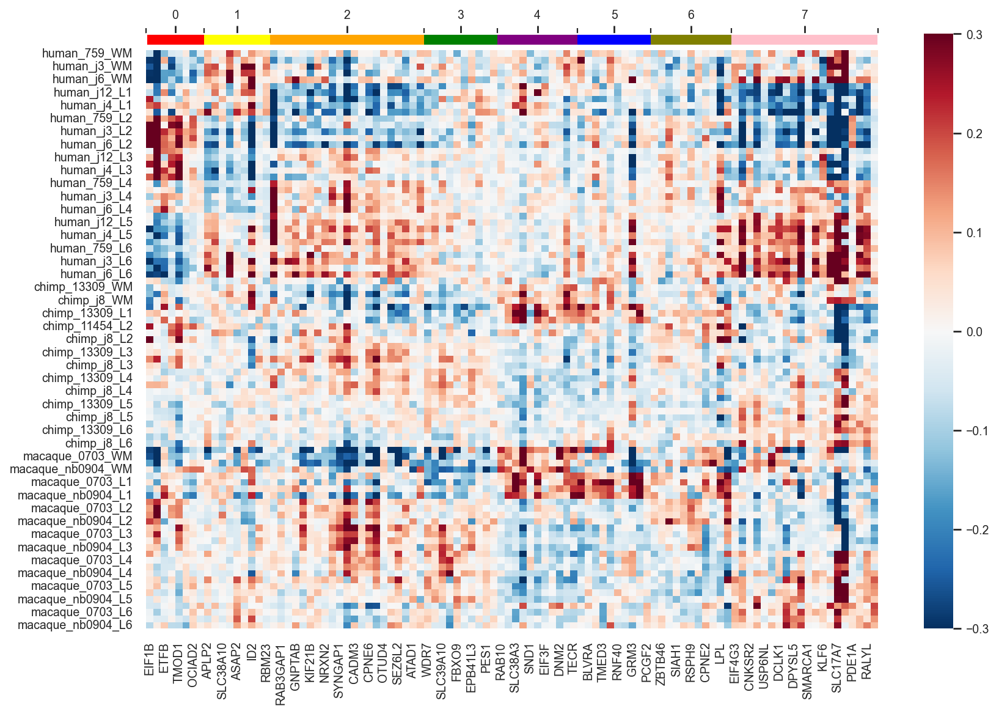

In [57]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df_hs[order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = ancova_labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

## Cluster profiles

In [58]:
df_annotation = df.copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [59]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AACS     AAGAB      AAK1      AAMP      AAR2     AARS1  \
condition layer                                                               
chimp     L1    -0.067096  0.006259 -0.005820  0.010712  0.019617  0.015548   
          L2    -0.121551  0.009986 -0.014660 -0.007021  0.020408 -0.027253   
          L3    -0.020433  0.006021 -0.007055 -0.020843 -0.009666 -0.005945   
          L4     0.042894  0.013482 -0.018464  0.018736  0.018289 -0.009535   
          L5     0.077460 -0.012463 -0.007488  0.018095 -0.016876 -0.010588   

                    AARS2     AASDH  AASDHPPT      AATF  ...     ZNFX1  \
condition layer                                          ...             
chimp     L1    -0.034335  0.005672 -0.129857 -0.058358  ...  0.044815   
          L2     0.047631 -0.007683  0.004536  0.004548  ...  0.007011   
          L3    -0.004735 -0.000847  0.040311 -0.004192  ... -0.014307   
          L4     0.004669  0.009721  0.054389 -0.000693  ... -0.015902   
          L5    -0.010982  0.000746  0.018721  0.007040  ... -0.023455   

                   ZNHIT3     ZNRD2     ZNRF1      ZPR1    ZRANB2   ZSCAN18  \
condition layer                                                               
chimp     L1    -0.000925 -0.016690 -0.170631  0.003003 -0.007677 -0.063229   
          L2     0.045854 -0.056595 -0.026596 -0.032378 -0.022169 -0.049828   
          L3     0.005685 -0.004065  0.055118  0.004217  0.001904  0.040170   
          L4    -0.006129  0.030007  0.066233  0.003156 -0.001717  0.037634   
          L5     0.004999 -0.019351  0.045583  0.000924  0.001682  0.036165   

                  ZSCAN21      ZUP1      ZZZ3  
condition layer                                
chimp     L1     0.028279 -0.101012  0.012691  
          L2     0.009310  0.026112  0.025918  
          L3    -0.008507  0.004399 -0.017862  
          L4     0.011091  0.003925 -0.037157  
          L5    -0.018131  0.015830 -0.014971  

[5 rows x 5390 columns]

In [60]:
# fig, axes = plt.subplots(2, 2,  figsize=(14, 3.5 * 2), gridspec_kw={'hspace': 0.4})
# for gene, ax in zip(layer_mean.columns, axes.flatten()):
#     (
#             layer_mean[gene]
#             .reorder_levels(['layer', 'condition'])
#             .unstack().loc[layers]
#             .plot
#             .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
#     )
#     ax.grid(False)

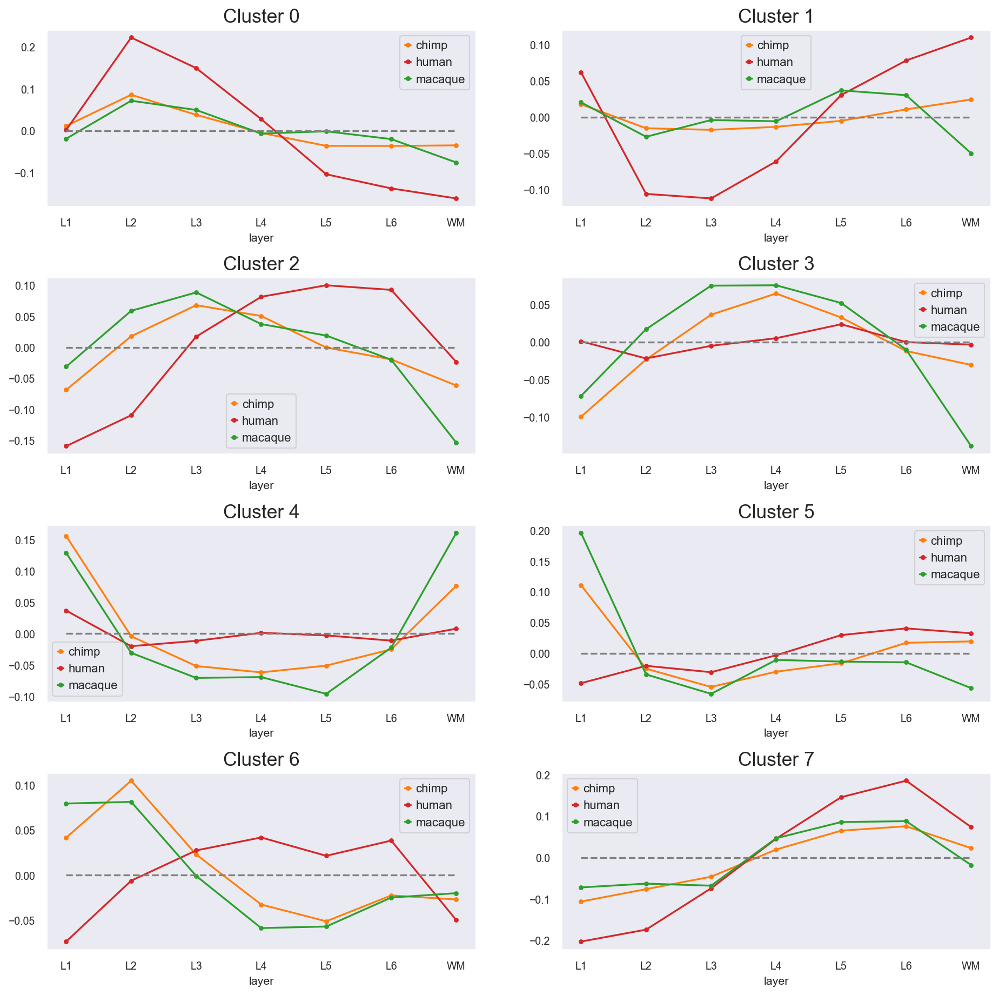

In [61]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)

for label, ax in zip(ancova_labels.unique(), axes.flatten()):
    genes = ancova_labels[ancova_labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

Text(0.5, 0.98, 'Median averaging for profiles')

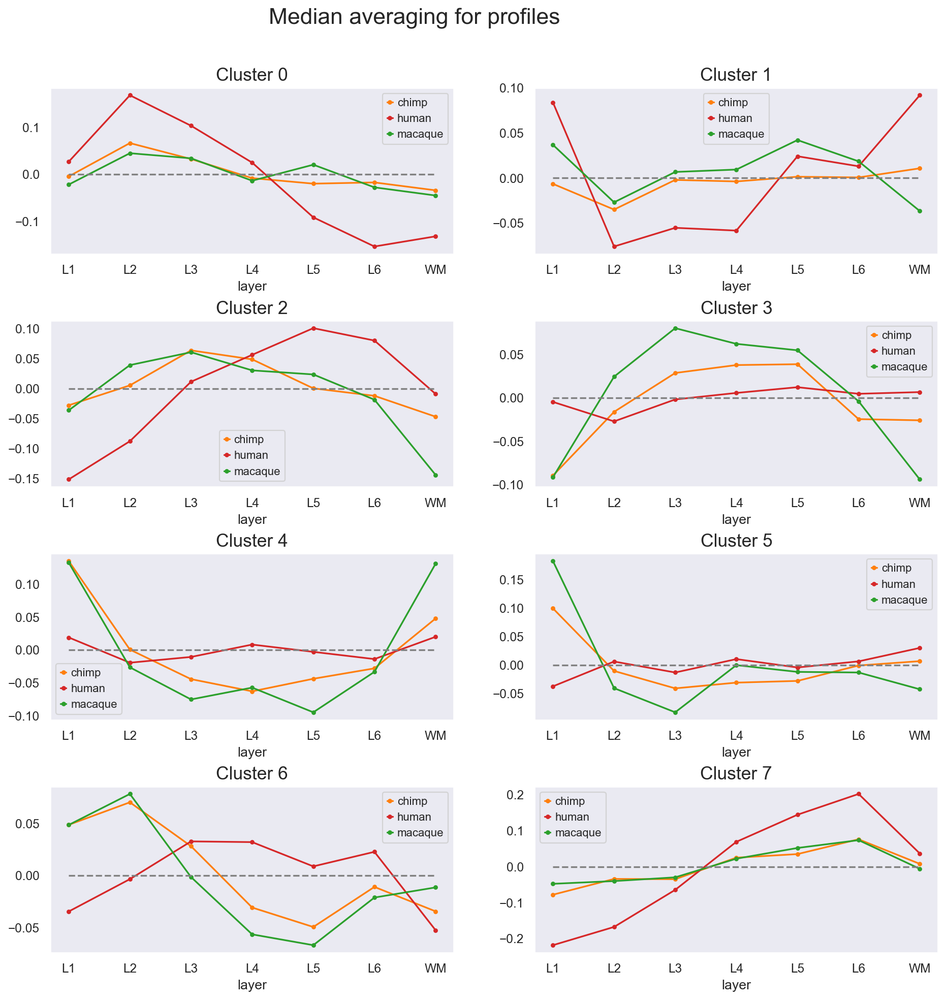

In [62]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(ancova_labels.unique(), axes.flatten()):
    genes = ancova_labels[ancova_labels == label].index.tolist()

    (
        layer_mean[genes]
        .median(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

fig.suptitle('Median averaging for profiles', fontsize=20)

## All genes

### Human

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

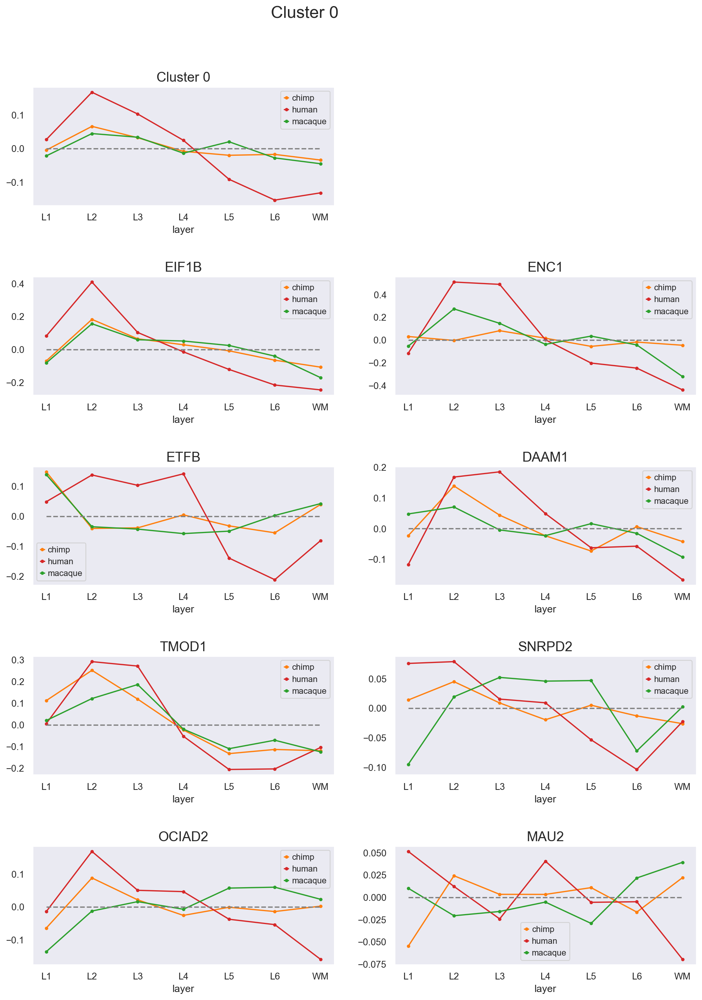

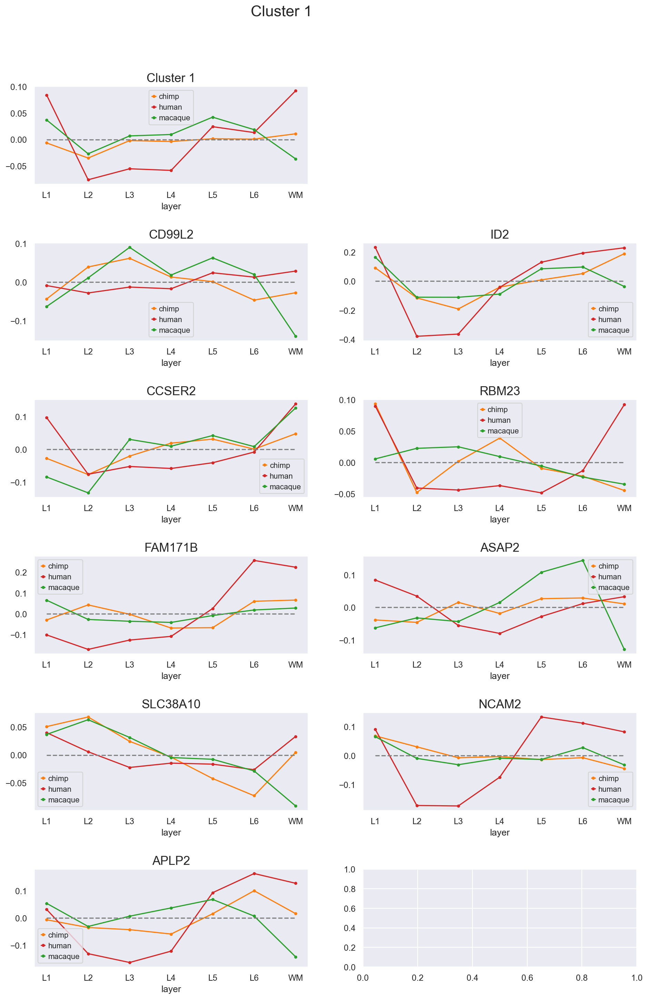

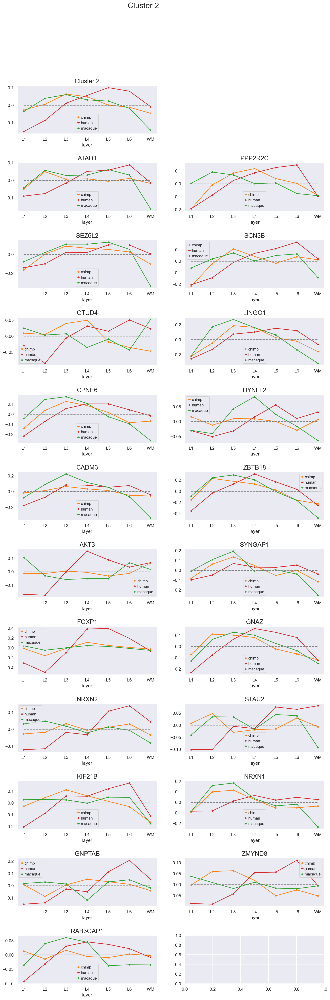

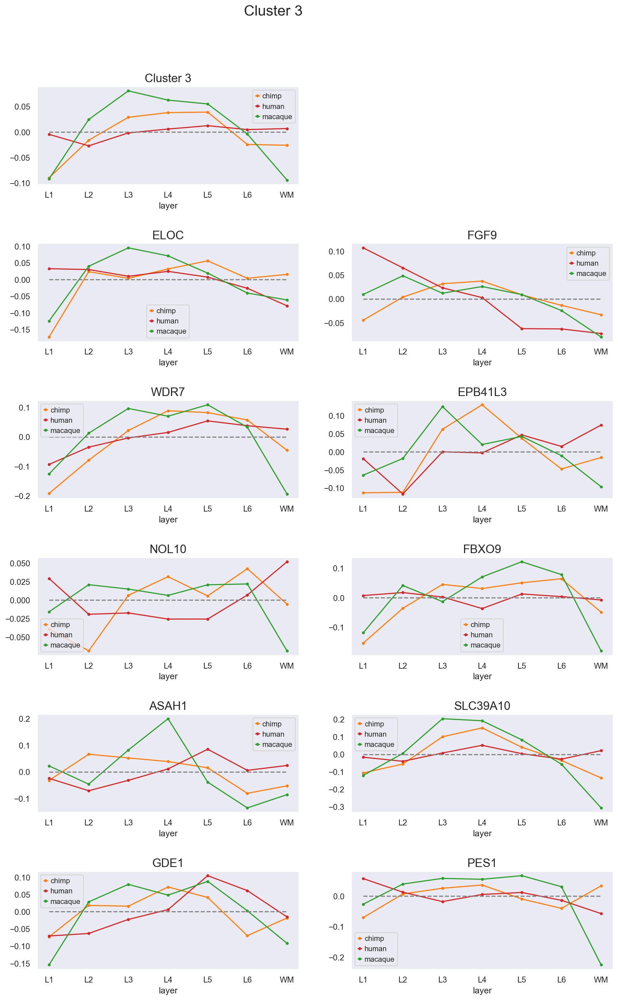

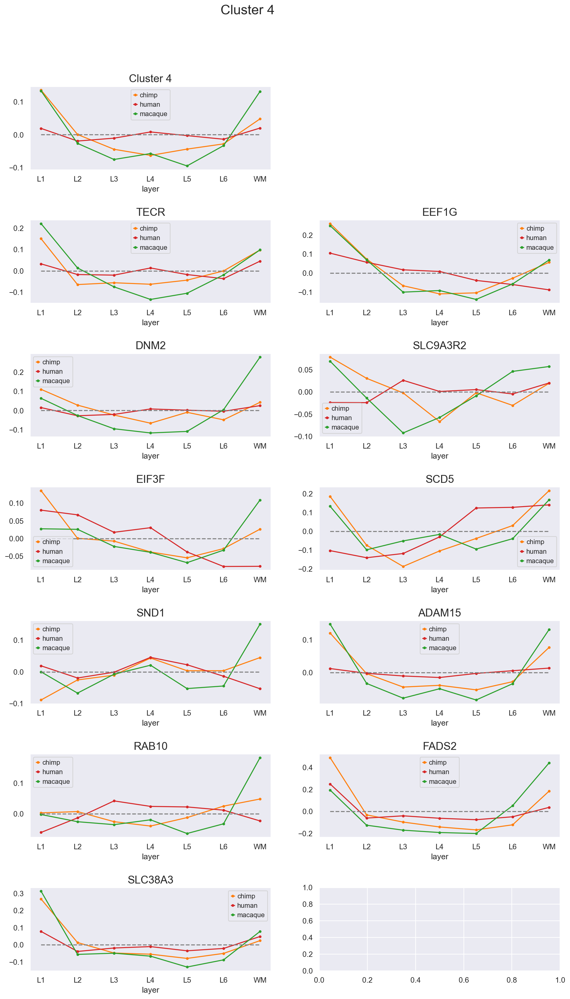

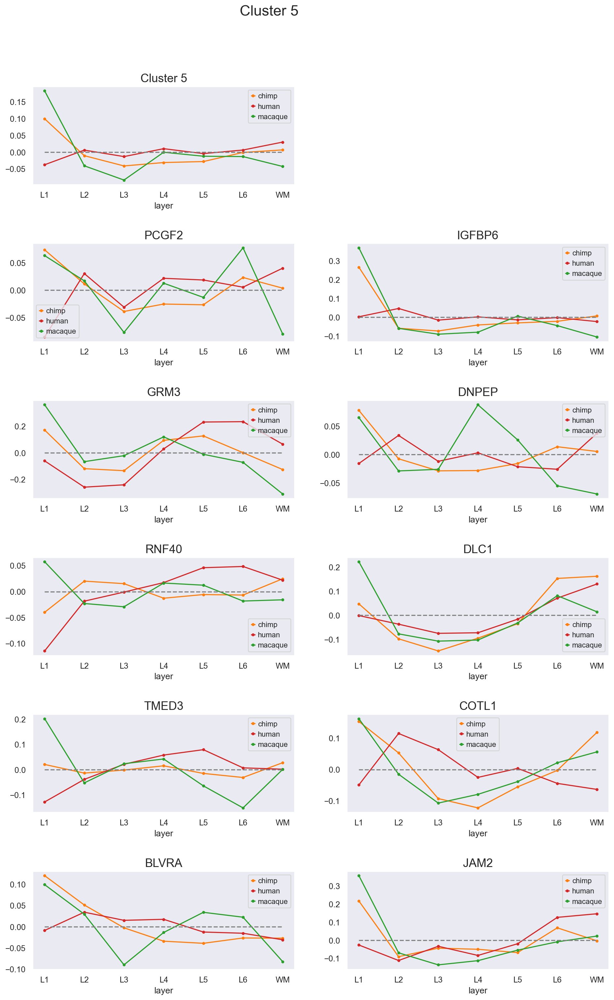

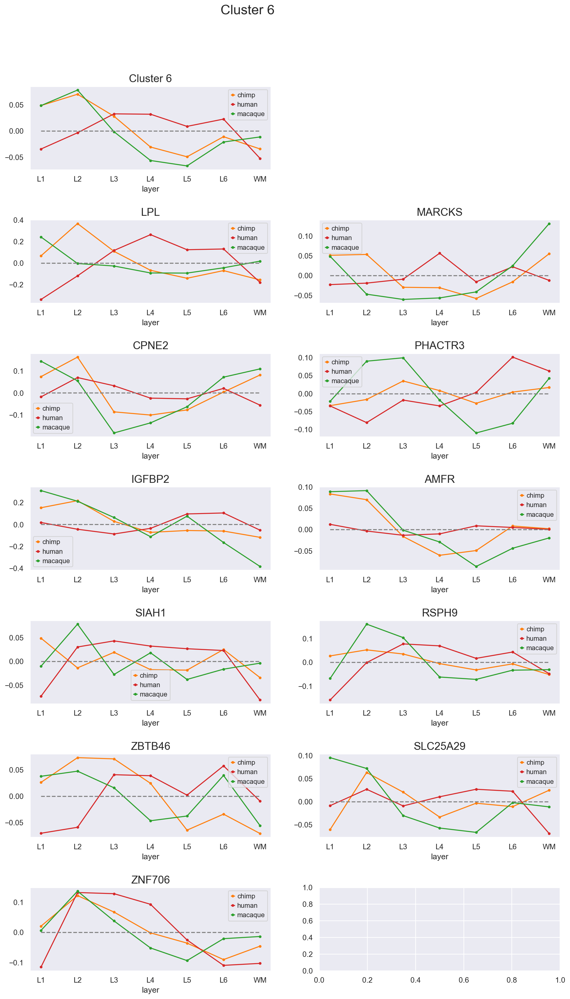

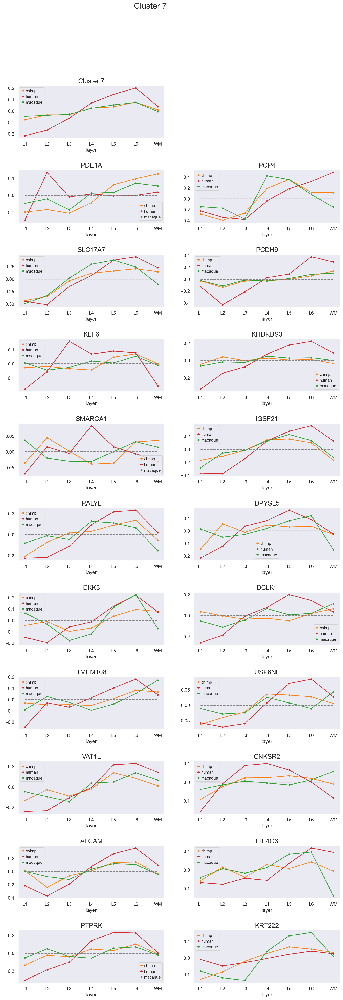

In [69]:
sns.set(font_scale=1)

for label in ancova_labels.unique():
    genes = ancova_labels[ancova_labels == label].index.tolist()
    fig, axes = plt.subplots((len(genes) + 3) // 2, 2,  figsize=(14, 3.5 * (len(genes) + 3) // 2), gridspec_kw={'hspace': 0.6})
    fig.suptitle(f'Cluster {label}', fontsize=20)

    ax = axes[0][0]

    (
        layer_mean[genes]
        .median(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    fig.delaxes(axes[0][1])
    
    
    for gene, ax in tqdm(list(zip(genes, axes.flatten()[2:]))):
        (
            layer_mean[gene]
            .reorder_levels(['layer', 'condition'])
            .unstack().loc[layers]
            .plot
            .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
        )
        ax.legend(fontsize=10)
        ax.set_title(f'{gene}', fontsize=16)
        ax.grid(False)
        ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    plt.savefig(f'results/clusters{pval_tr}/hs_genes_cluster_{pval_tr}_{n_clusters}_{label}.pdf')

### Chimp

In [51]:
cs_genes = sign_genes['chimp-macaque'].intersection(sign_genes['human-chimp']).difference(sign_genes['human-macaque'])
cs_genes, cs_genes.size

(Index(['ACHE', 'ACTN2', 'ANK3', 'ANKIB1', 'ARF5', 'ARID4A', 'ARID4B', 'AZIN2',
        'BAIAP2', 'BTF3', 'CAMK2G', 'COBL', 'CTDNEP1', 'DCAKD', 'DCBLD2',
        'DENND4B', 'DNAJB6', 'DYNC1I2', 'DYNC1LI1', 'ENOX1', 'FAM71E1',
        'FAM76A', 'FAU', 'GIPC1', 'GOLPH3', 'HCCS', 'HEY1', 'HINT1', 'HINT2',
        'HMGCLL1', 'HNRNPA3', 'HSPB11', 'KCNC2', 'KLF3', 'KXD1', 'LCMT1',
        'LRP3', 'LSM5', 'MAP3K7', 'METTL5', 'MGST3', 'MICU1', 'MIF', 'MORN4',
        'MRPL23', 'MRPL37', 'MRPS36', 'MYCBP2', 'NCOA3', 'NELL2', 'NETO1',
        'NUAK1', 'NUBP2', 'NUDCD1', 'NUP93', 'PARP8', 'PBRM1', 'PDE4B',
        'PITHD1', 'PLCB1', 'PML', 'POLR2C', 'PRXL2B', 'PTOV1', 'RADX',
        'RASL11B', 'RETREG1', 'RIPOR2', 'RNF2', 'RPL10', 'RPL35A', 'RPL5',
        'RPS16', 'RPS29', 'RPS5', 'RSL24D1', 'SCRN3', 'SDHD', 'SEC13', 'SEMA3A',
        'SERPINE2', 'SGTB', 'SLIRP', 'SORL1', 'SPP1', 'SRI', 'STARD4', 'STT3B',
        'SULF1', 'TAGLN2', 'TBC1D24', 'TMEM259', 'TSPAN3', 'UQCRH', 'USP11',
        'UTP1

In [52]:
ancova_labels_chimp = pd.read_csv('./results/chimp_clusters_ancova.csv', index_col=0)['0'].sort_values()
ancova_labels_chimp

ZBTB8OS     0
ARF5        0
ANK3        0
ACTN2       0
COBL        0
           ..
CAMK2G      4
TBC1D24     4
CTDNEP1     4
DYNC1LI1    4
ACHE        4
Name: 0, Length: 100, dtype: int64

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/23 [00:00<?, ?it/s]

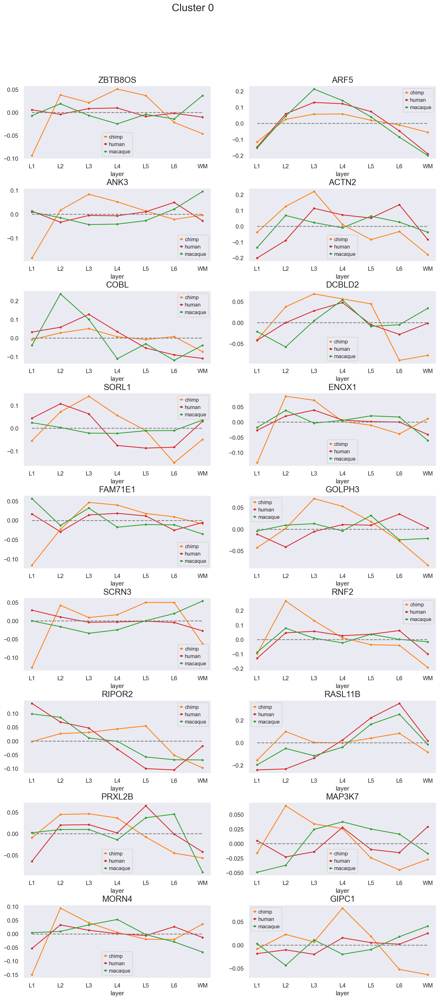

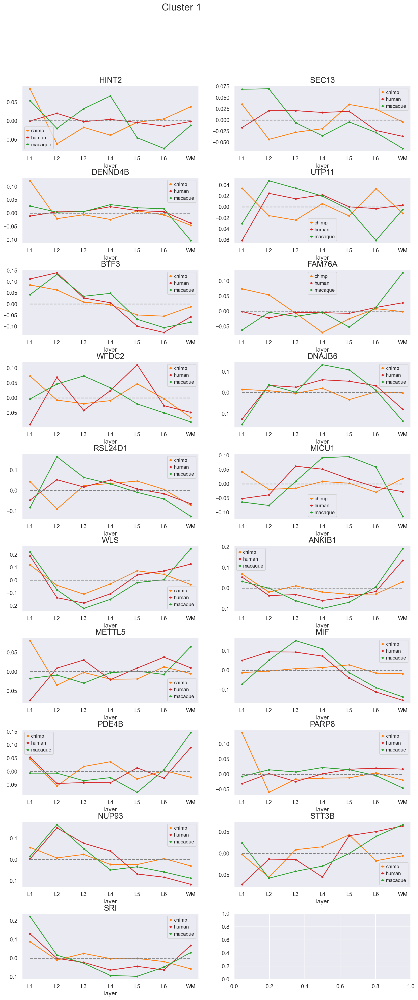

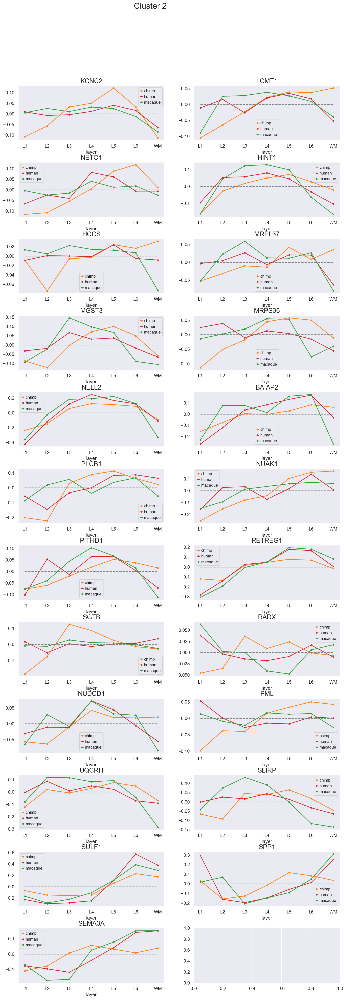

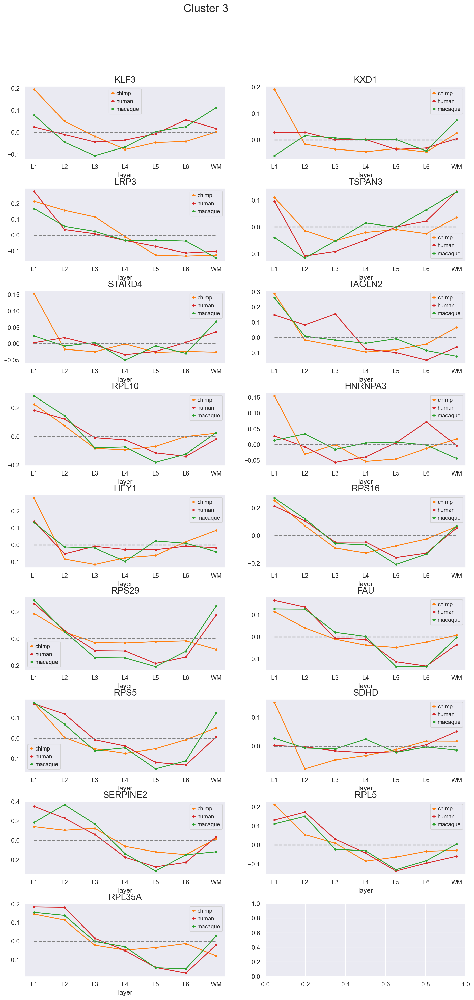

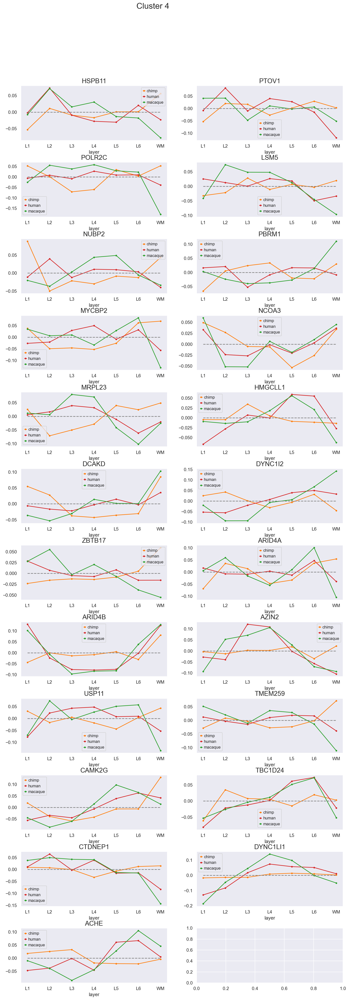

In [56]:
sns.set(font_scale=1)

for label in ancova_labels_chimp.unique():
    genes = ancova_labels_chimp[ancova_labels_chimp == label].index.tolist()
    fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})
    fig.suptitle(f'Cluster {label}', fontsize=20)
    
    for gene, ax in tqdm(list(zip(genes, axes.flatten()))):
        (
            layer_mean[gene]
            .reorder_levels(['layer', 'condition'])
            .unstack().loc[layers]
            .plot
            .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
        )
        ax.legend(fontsize=10)
        ax.set_title(f'{gene}', fontsize=16)
        ax.grid(False)
        ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
    plt.savefig(f'results/cs_genes_cluster{label}.pdf')